/var/folders/jx/n85hw6mj0h53qvj7zcmrfxz00000gn/T/ipykernel_39860/97723772.py:6: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-pastel')


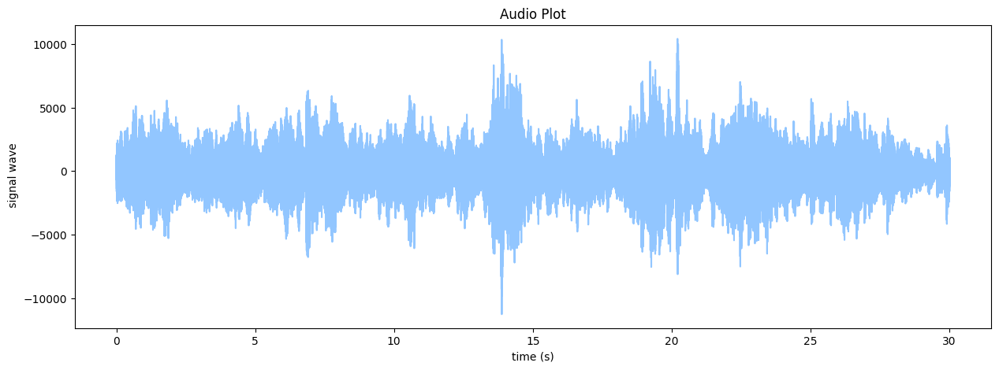

In [1]:
import wave
import matplotlib.pyplot as plt 
import numpy as np
from matplotlib import animation
from matplotlib.animation import FuncAnimation
plt.style.use('seaborn-pastel')

obj = wave.open('classical.00000.wav', 'rb')


sample_freq = obj.getframerate()
n_samples = obj.getnframes()
signal_wave = obj.readframes(-1)
duration = n_samples/sample_freq
signal_array = np.frombuffer(signal_wave, dtype=np.int16)
time = np.linspace(0, duration, num=n_samples)

plt.figure(figsize=(15, 5))
plt.plot(time, signal_array)
plt.title('Audio Plot')
plt.ylabel(' signal wave')
plt.xlabel('time (s)')
plt.show()

In [60]:
len(signal_array[::800])

828

/Users/stephy/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


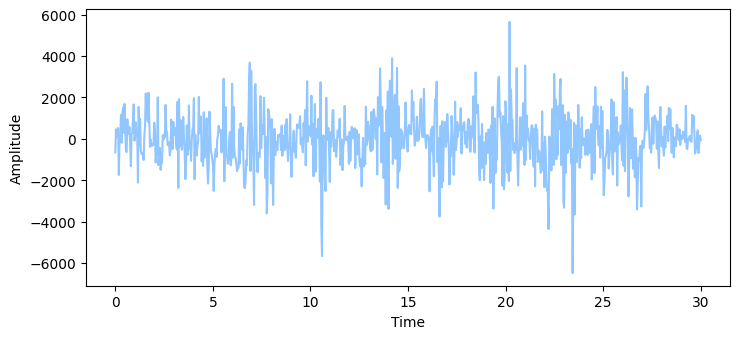

In [59]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Generate some sample data
t = time[::800]
x = signal_array[::800]
#x = np.sin(t) + 0.5*np.sin(5*t)

# Create the figure and axes for the plot
fig, ax = plt.subplots()

# Plot the initial waveform
line, = ax.plot(t, x)

# Define the animation function
def animate(i):
    # Shift the waveform by one step to the left
    n = i % len(x)
    if list(x[n:])==[]:
        y=x
    elif list(x[:n])==[]:
        y=x
    else:
        y = list(x[n:]) + list(x[:n])
    line.set_ydata(y)
    return line,

# Define the animation object
ani = animation.FuncAnimation(fig, animate, frames=200, interval=50, blit=False)
#HTML(ani.to_jshtml())

# Set the axis limits and labels
ax.set_xlabel('Time')
ax.set_ylabel('Amplitude')

# Show the plot
plt.show()
HTML(ani.to_jshtml())

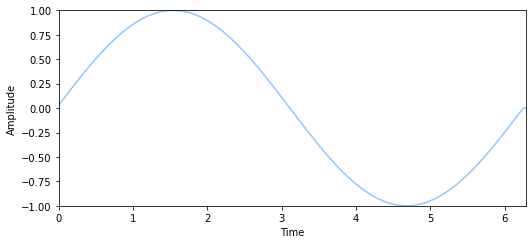

In [45]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Generate some sample data
t = time
x = signal_array

# Create the figure and axes for the plot
fig, ax = plt.subplots()

# Plot the initial waveform
line, = ax.plot(t, x)

# Define the animation function
def animate(frame):
    # Shift the waveform by one step to the left
    x[:-1] = x[1:]
    x[-1] = np.sin(frame/10.0)
    # Update the line data with the new waveform
    line.set_ydata(x)
    return line,

# Define the animation object
ani = animation.FuncAnimation(fig, animate, frames=200, interval=50, blit=True)

# Set the axis limits and labels
#ax.set_xlim(0, 2*np.pi)
#ax.set_ylim(-1, 1)
ax.set_xlabel('Time')
ax.set_ylabel('Amplitude')

# Show the plot
plt.show()
HTML(ani.to_jshtml())

/Users/stephy/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


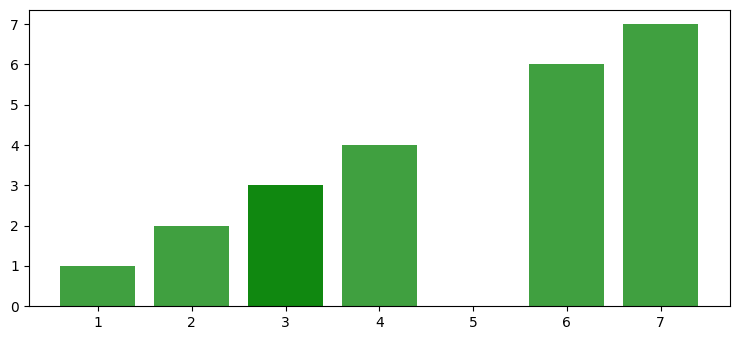

In [31]:
from IPython.display import HTML
import numpy as np
from matplotlib import animation as animation, pyplot as plt, cm

plt.rcParams["figure.figsize"] = [7.50, 3.50]
plt.rcParams["figure.autolayout"] = True

fig = plt.figure()

data = [1, 4, 3, 2, 6, 7, 3]
colors = ['red', 'yellow', 'blue', 'green', 'black']
bars = plt.bar(data, data, facecolor='green', alpha=0.75)

def animate(frame):
   global bars
   index = np.random.randint(1, 7)
   bars[frame].set_height(index)
   bars[frame].set_facecolor(colors[np.random.randint(0, len(colors))])

ani = animation.FuncAnimation(fig, animate, frames=len(data))

plt.show()

HTML(ani.to_jshtml())